# Working with Images

Most of the times, when people think of working with images, photoshop is what comes to mind. In this notebook we will learn how to using Python for image manipulation using PIL library.

The Python Imaging Library adds image processing capabilities to your Python interpreter.

In [1]:
import pandas as pd
import matplotlib.pyplot as plt 
from matplotlib import image
import seaborn as sns

Loading images with Matplotlib

<class 'numpy.ndarray'> (1024, 1024, 3)


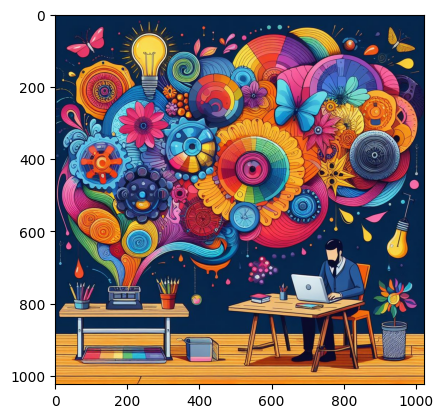

In [5]:
img = image.imread('images/1.jpeg')
print(type(img), img.shape)
plt.imshow(img)

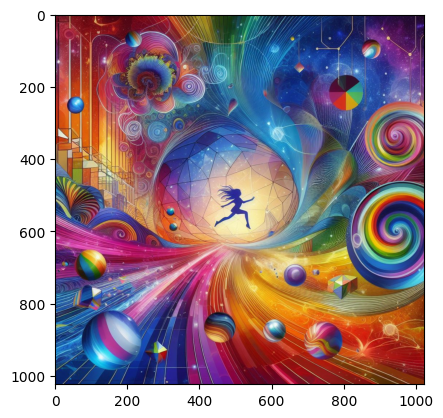

In [6]:
img = image.imread('images/2.jpeg')
img.shape
plt.imshow(img)

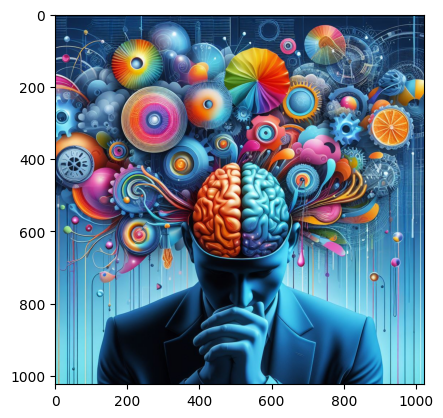

In [7]:
img = image.imread('images/3.jpeg')
img.shape
plt.imshow(img)

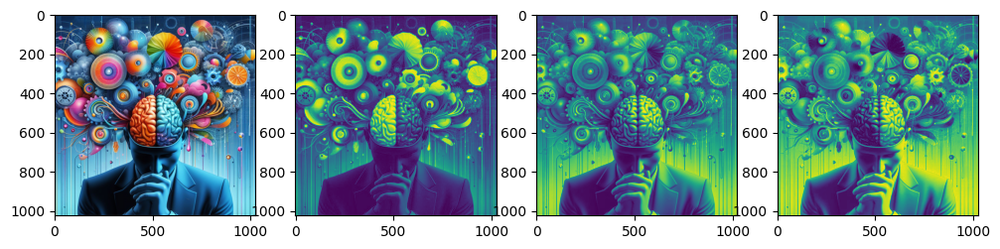

In [8]:
plt.figure(figsize=(12, 12))
plt.subplot(1,4,1)
plt.imshow(img)

plt.subplot(1,4,2)
plt.imshow(img[:,:,0])

plt.subplot(1,4,3)
plt.imshow(img[:,:,1])

plt.subplot(1,4,4)
plt.imshow(img[:,:,2])

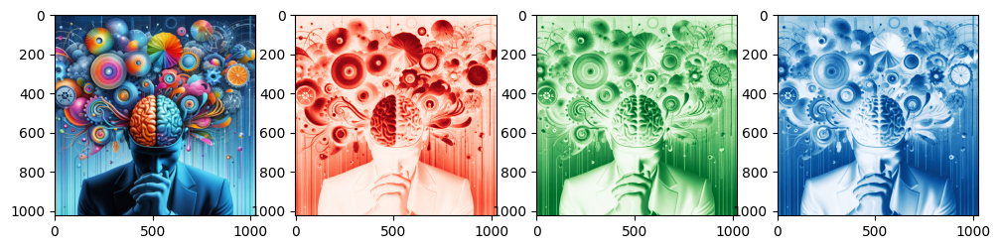

In [9]:
plt.figure(figsize=(12, 12))

plt.subplot(1, 4, 1)
plt.imshow(img)

plt.subplot(1, 4, 2)
plt.imshow(img[:,:,0], cmap='Reds')

plt.subplot(1, 4, 3)
plt.imshow(img[:,:,1], cmap='Greens')

plt.subplot(1, 4, 4)
plt.imshow(img[:,:,2], cmap='Blues')

Loading Images with PIL

In [10]:
from PIL import Image

In [12]:
img = Image.open('images/4.jpeg')
print(type(img))
img.show() # opens in new window

<class 'PIL.JpegImagePlugin.JpegImageFile'>


No applications found for mimetype: image/png
.

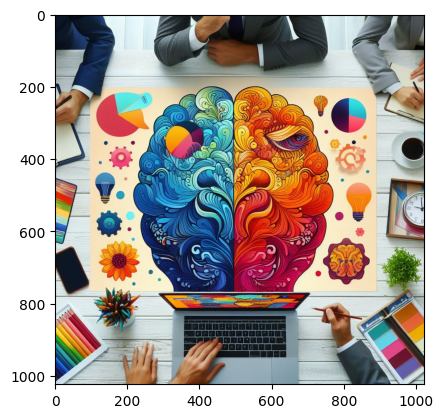

In [13]:
plt.imshow(img)

In [ ]:
# display(img)

In [14]:
print(img.size) # (width, height in pixels)
print(img.filename)
print(img.format)
print(img.mode)

(1024, 1024)
images/4.jpeg
JPEG
RGB


## Image Format

Image formats refer to the ways in which digital images are encoded and stored. Each format has its own specifications for representing color information, compression, and other features. Common image formats include:

1. JPEG (Joint Photographic Experts Group):
Well-suited for photographs and images with complex color gradients. It uses lossy compression.

2. PNG (Portable Network Graphics):
Suitable for images with transparency and sharp edges, such as logos and icons. It uses lossless compression.

3. GIF (Graphics Interchange Format):
Often used for simple graphics, animations, and images with a limited color palette. It uses lossless compression and supports animation.

4. TIFF (Tagged Image File Format):
A flexible format suitable for high-quality images and professional printing. It supports lossless compression and can store multiple images in a single file.

5. BMP (Bitmap):
A basic, uncompressed format used for simple graphics. It stores color information pixel by pixel.

6. RAW:
A format used to store minimally processed data from the image sensor of a digital camera. It retains more information but results in larger file sizes.

7. WebP:
Developed by Google, it provides both lossy and lossless compression. It aims for smaller file sizes while maintaining image quality.

## Image Mode

An image mode determines the number of colors that can be displayed in an image and can also affect the file size of the image. Image modes represent the color space or the number of channels in an image. The most common image modes include:

RGB (Red, Green, Blue):
The most common color mode for digital images. Each pixel is composed of three color channels: red, green, and blue.

Grayscale:
A single-channel mode where pixel values represent intensity levels from black to white. It is often used for black-and-white images.

CMYK (Cyan, Magenta, Yellow, Black):
Used in color printing. It represents colors using four channels: cyan, magenta, yellow, and black.

Indexed Color:
Uses a color palette to represent the image. Each pixel's color is an index into the palette.

RGBA (Red, Green, Blue, Alpha):
Similar to RGB but includes an additional channel (alpha) for representing transparency.

HSV (Hue, Saturation, Value):
HSV is often used in computer vision and image processing tasks because it separates color information from brightness, making certain operations more intuitive.

## Images as arrays of data

What is an image? So far, PIL has handled loading images and displaying them. However, if we're going to use images as data, we need to understand what that data looks like.
Most image formats have three color "channels": red, green, and blue (some images also have a fourth channel called "alpha" that controls transparency). For each pixel in an image, there is a value for every channel.

The way this is represented as data is as a three-dimensional matrix. The width of the matrix is the width of the image, the height of the matrix is the height of the image, and the depth of the matrix is the number of channels. So, as we saw, the height and width of our image are both 100 pixels. This means that the underlying data is a matrix with the dimensions 100x100x3.

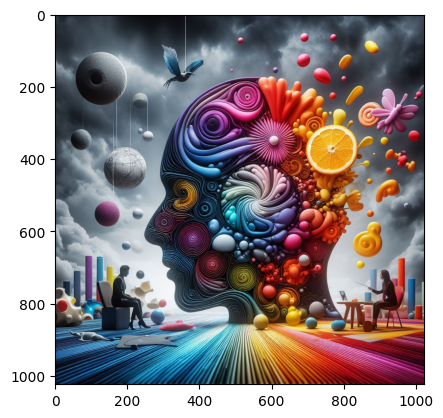

In [15]:
img = Image.open('images/5.jpeg')
plt.imshow(img)

In [17]:
import numpy as np

In [18]:
# Turn our image object into a Numpy array
img_arr = np.array(img)
print(type(img_arr),img_arr.shape)

<class 'numpy.ndarray'> (1024, 1024, 3)


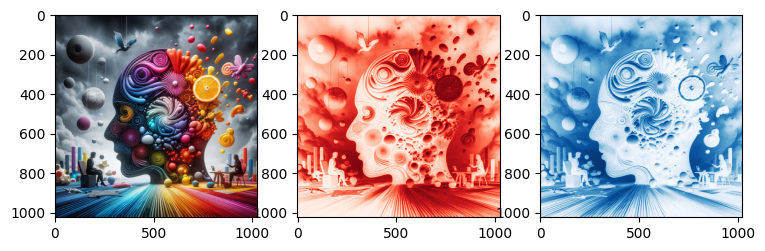

In [19]:
plt.figure(figsize=(12,12))

plt.subplot(1,4,1)
plt.imshow(img_arr)

plt.subplot(1,4,2)
plt.imshow(img_arr[:,:,0], cmap='Reds')

plt.subplot(1,4,3)
plt.imshow(img_arr[:,:,1], cmap='Greens')

plt.subplot(1,4,3)
plt.imshow(img_arr[:,:,2], cmap='Blues')



In [20]:
img.split()

(<PIL.Image.Image image mode=L size=1024x1024>,
 <PIL.Image.Image image mode=L size=1024x1024>,
 <PIL.Image.Image image mode=L size=1024x1024>)

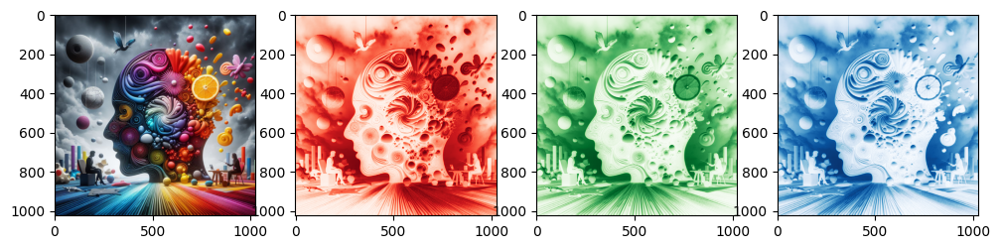

In [21]:
red, green, blue = img.split()

plt.figure(figsize=(12, 12))

plt.subplot(1, 4, 1)
plt.imshow(img)

plt.subplot(1, 4, 2)
plt.imshow(red, cmap='Reds')

plt.subplot(1, 4, 3)
plt.imshow(green, cmap='Greens')

plt.subplot(1, 4, 4)
plt.imshow(blue, cmap='Blues')

# Image manipulation with PIL

Pillow has a number of common image manipulation tasks built into the library. For example, one may want to resize an image so that the file size is smaller. Or, perhaps, convert an image to black-and-white instead of color. Operations that Pillow provides include:

- rotating
- flipping
- cropping
- resizing
Often, these kinds of manipulations are part of the pipeline for turning a small number of images into more images to create training data for machine learning algorithms. This technique is called data augmentation, and it is a common technique for image classification.
We'll try a couple of these operations and look at the results.

Rotating

In [2]:
from PIL import Image

img = Image.open('images/2.jpeg')

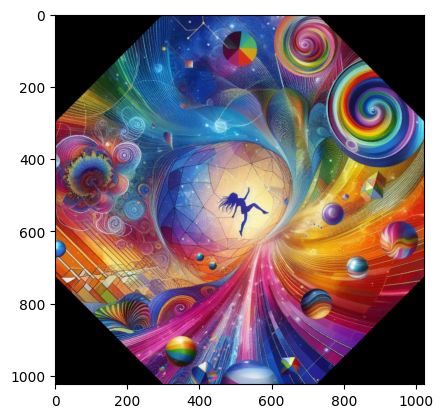

In [25]:
# rotate the image by 45 degrees
img_rotated = img.rotate(45)
plt.imshow(img_rotated)

In [3]:
img = Image.open('images/_820744a1-b78c-45ce-ae3d-f98156839b16.jpeg')

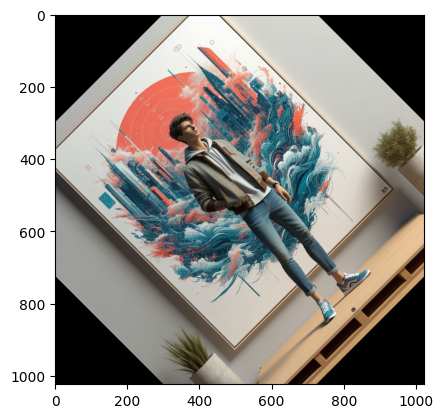

In [4]:
# rotate the image by 45 degrees
img_rotated = img.rotate(45)
plt.imshow(img_rotated)

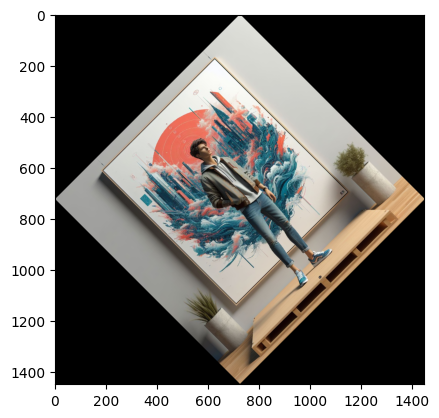

In [5]:
# rotate the image by 45 degrees and expand=True
img_rotated = img.rotate(45, expand=True)
plt.imshow(img_rotated)

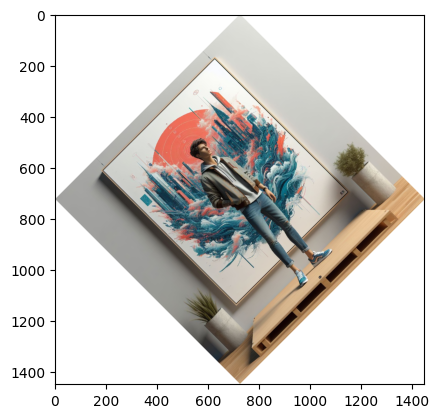

In [6]:
# rotate the image by 45 degrees with fillcolor
img_rotated = img.rotate(45, expand=True, fillcolor=(255,255,255))
plt.imshow(img_rotated)

Cropping

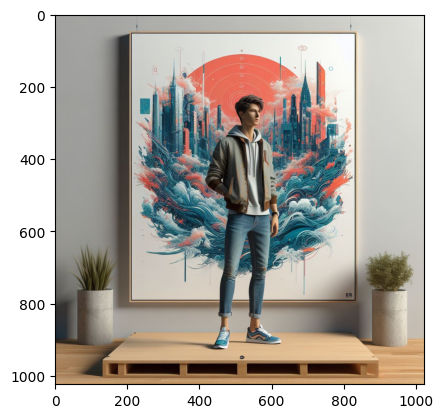

In [7]:
plt.imshow(img)

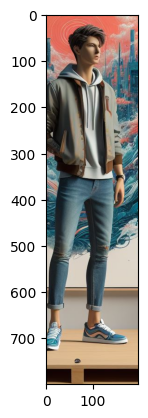

In [25]:
# Crop the image to 25, 25, 75, 75 - Left_x, top_y, right_x, bottom_y
img_cropped = img.crop((450, 200, 650, 1000))
plt.imshow(img_cropped)

Flipping

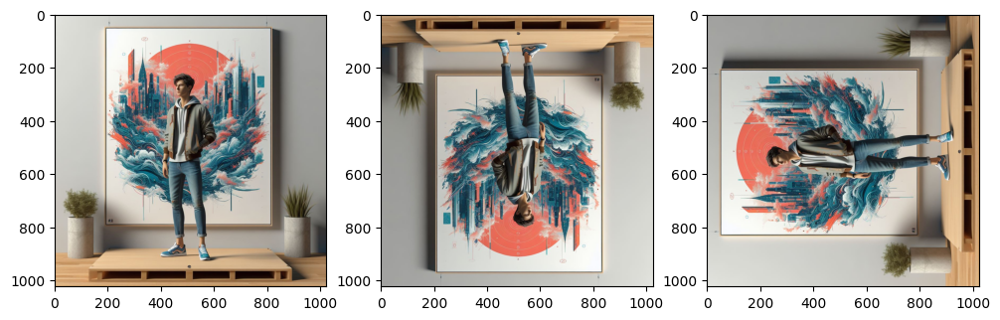

In [26]:
plt.figure(figsize=(12,12))

plt.subplot(1,3,1)
# flip the image left to right
img_flipped_horizontal = img.transpose(Image.Transpose.FLIP_LEFT_RIGHT)
plt.imshow(img_flipped_horizontal)

plt.subplot(1, 3, 2)
# flip the image left to right
img_flipped_vertical = img.transpose(Image.Transpose.FLIP_TOP_BOTTOM)
plt.imshow(img_flipped_vertical)

plt.subplot(1, 3, 3)
# flip the image left to right
img_flipped = img.transpose(Image.Transpose.TRANSPOSE)
plt.imshow(img_flipped)

Resizing

In [27]:
new_img = img.resize((200, 200))
new_img.save('images/_bbf0696d-d296-45be-90b3-d7379430ec8d.jpeg')

print(img.size) # Output: (7680, 4320)
print(new_img.size) # output: (200, 200)

(1024, 1024)
(200, 200)


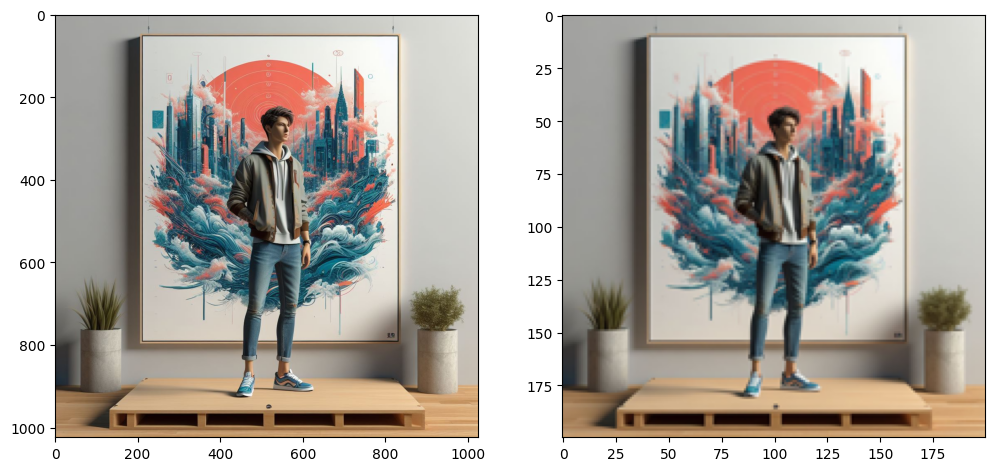

In [28]:
plt.figure(figsize=(12, 12))

plt.subplot(1, 2, 1)
plt.imshow(img)

plt.subplot(1, 2, 2)
plt.imshow(new_img)

(200, 200)


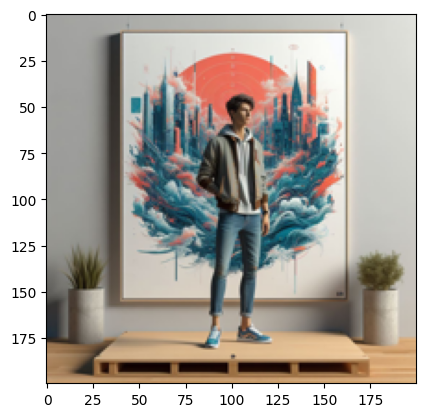

In [29]:
img.thumbnail((200, 200))
img.save('images/_820744a1-b78c-45ce-ae3d-f98156839b16.jpeg')

print(img.size)
plt.imshow(img)

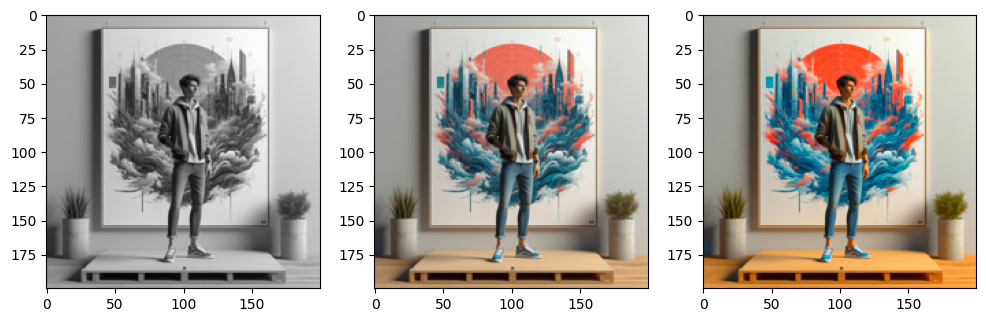

In [30]:
from PIL import ImageEnhance

plt.figure(figsize=(12, 8))

# vibrance enhancer - use 0, 1, 1.5, 2, etc
color_enhancer = ImageEnhance.Color(img)

plt.subplot(1,3,1)
plt.imshow(color_enhancer.enhance(0))

plt.subplot(1,3,2)
plt.imshow(color_enhancer.enhance(1))

plt.subplot(1,3,3)
plt.imshow(color_enhancer.enhance(2))

Image Enhancement

PIL can change the vibrance, contrast, brightness and sharpness using ImageEnhance

In [1]:
import matplotlib.pyplot as plt 
from matplotlib import image 

from PIL import Image

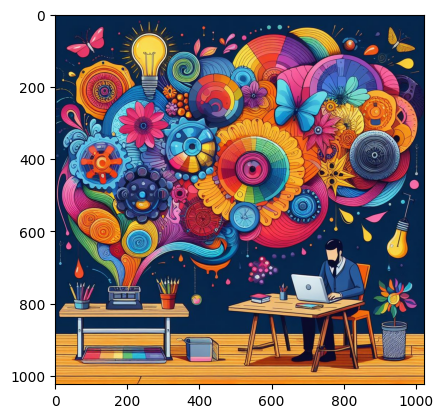

In [3]:
img = Image.open('images/1.jpeg')
plt.imshow(img)

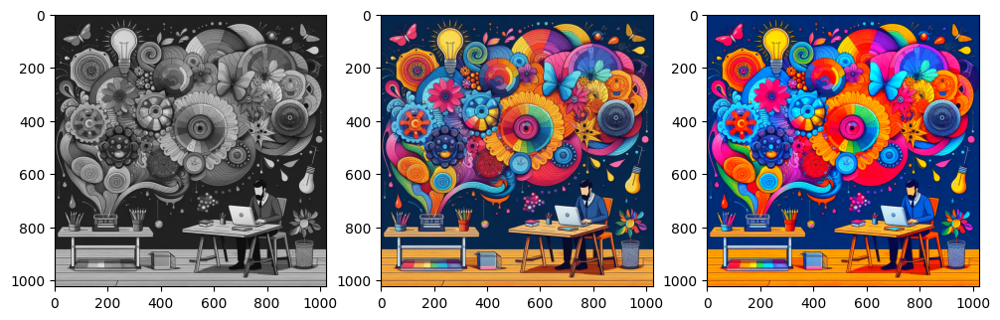

In [4]:
from PIL import ImageEnhance

plt.figure(figsize=(12, 8))

# vibrance enhancer - use 0, 1, 1.5, 2, etc
color_enhancer = ImageEnhance.Color(img)

plt.subplot(1, 3, 1)
plt.imshow(color_enhancer.enhance(0))

plt.subplot(1, 3, 2)
plt.imshow(color_enhancer.enhance(1))

plt.subplot(1, 3, 3)
plt.imshow(color_enhancer.enhance(2))

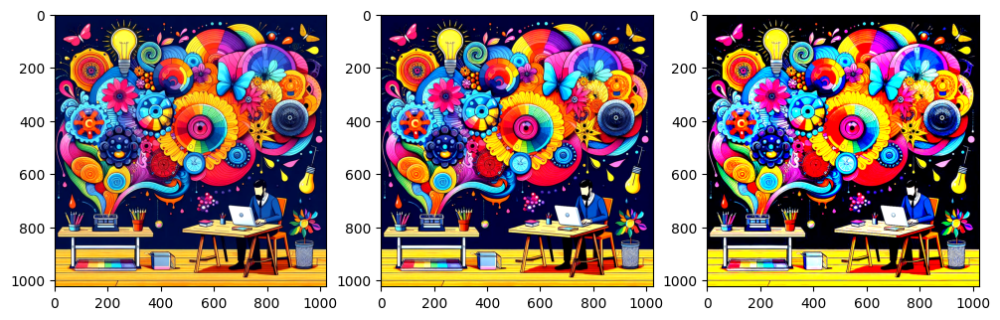

In [6]:
plt.figure(figsize=(12, 8))

# vibrance enhancer - use 0, 1, 1.5, 2, etc
color_enhancer = ImageEnhance.Contrast(img)

plt.subplot(1, 3, 1)
plt.imshow(color_enhancer.enhance(1.5))

plt.subplot(1, 3, 2)
plt.imshow(color_enhancer.enhance(2))

plt.subplot(1, 3, 3)
plt.imshow(color_enhancer.enhance(5))

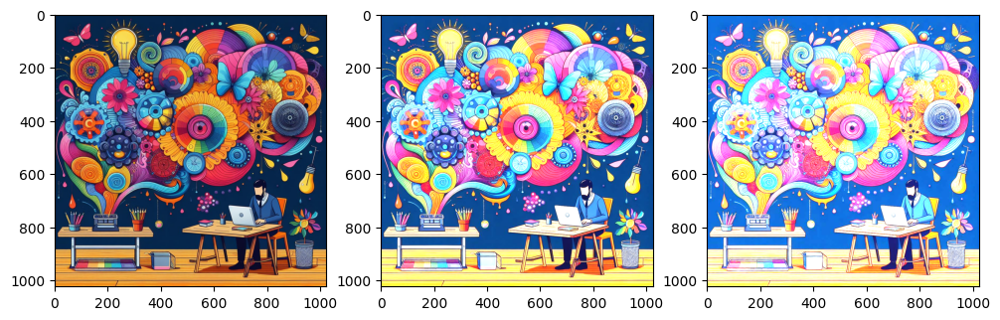

In [8]:
from PIL import ImageEnhance

plt.figure(figsize=(12, 8))

# vibrance enhancer - use 0, 1, 1.5, 2, etc
brightness_enhancer = ImageEnhance.Brightness(img)

plt.subplot(1, 3, 1)
plt.imshow(brightness_enhancer.enhance(1))

plt.subplot(1, 3, 2)
plt.imshow(brightness_enhancer.enhance(2))

plt.subplot(1, 3, 3)
plt.imshow(brightness_enhancer.enhance(3))

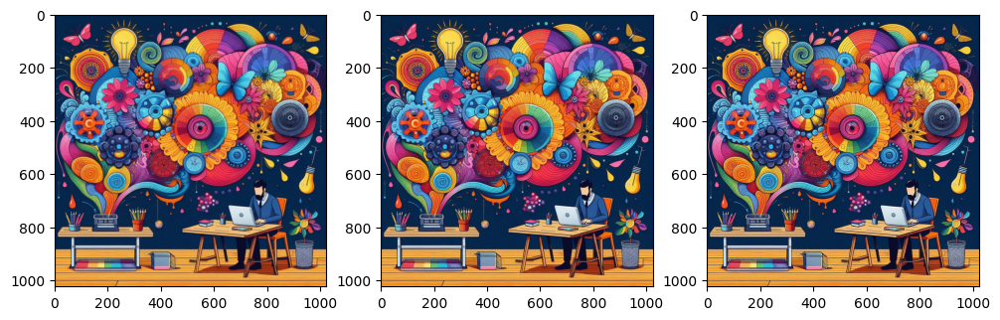

In [11]:
from PIL import ImageEnhance

plt.figure(figsize=(12, 8))

# vibrance enhancer - use 0, 1, 1.5, 2, etc
sharpness_enhancer = ImageEnhance.Sharpness(img)

plt.subplot(1, 3, 1)
plt.imshow(sharpness_enhancer.enhance(0))

plt.subplot(1, 3, 2)
plt.imshow(sharpness_enhancer.enhance(1))

plt.subplot(1, 3, 3)
plt.imshow(sharpness_enhancer.enhance(2))

Filters

PIL can also do blur, contour, emboss, sharpening, smooth, etc using Imagefilter 

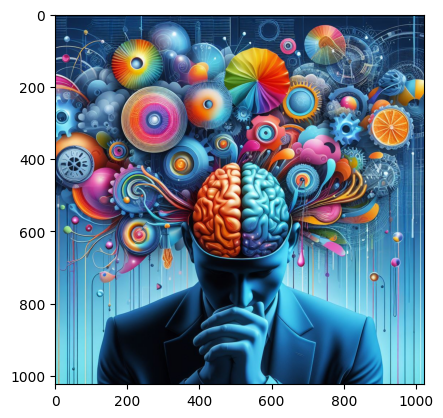

In [12]:
img = Image.open('images/3.jpeg')
plt.imshow(img)

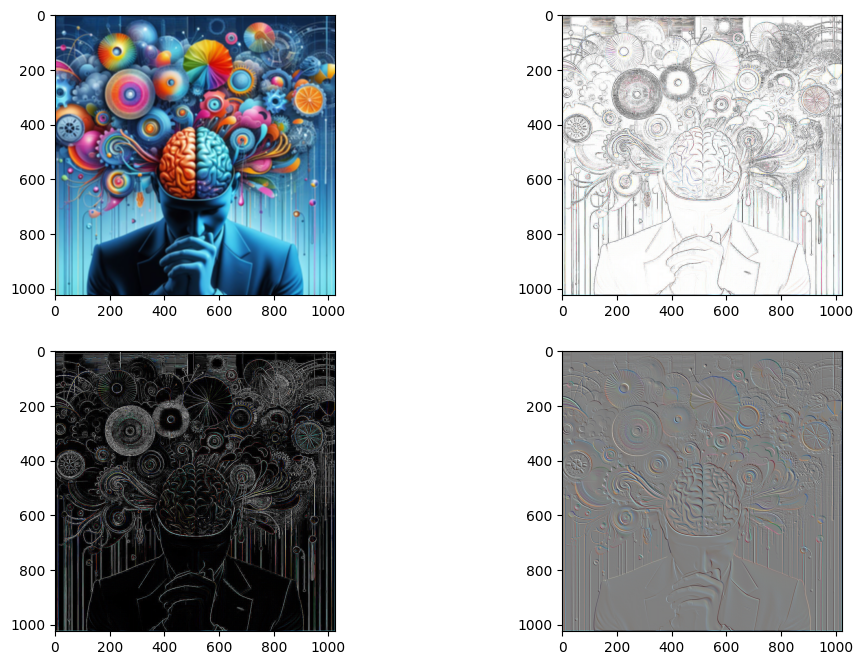

In [13]:
from PIL import ImageFilter

plt.figure(figsize=(12,8))

plt.subplot(2,2,1)
plt.imshow(img.filter(ImageFilter.BLUR))

plt.subplot(2, 2, 2)
plt.imshow(img.filter(ImageFilter.CONTOUR))

plt.subplot(2, 2, 3)
plt.imshow(img.filter(ImageFilter.FIND_EDGES))

plt.subplot(2, 2, 4)
plt.imshow(img.filter(ImageFilter.EMBOSS))

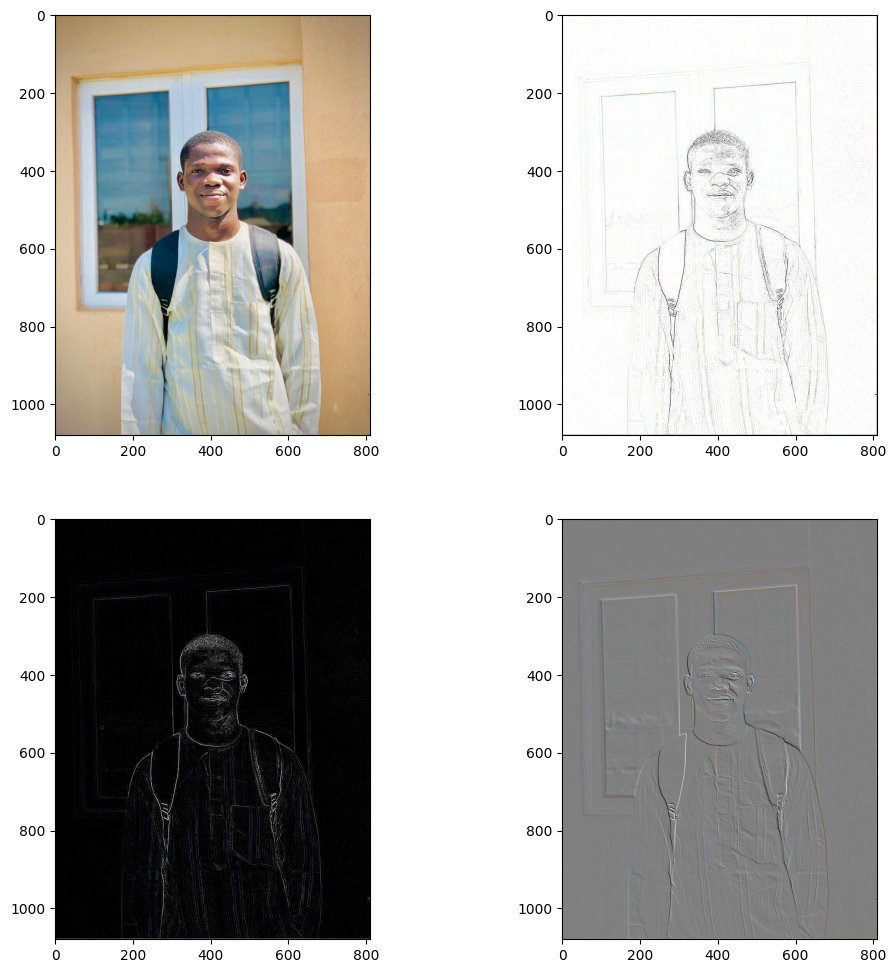

In [9]:
# Example
import matplotlib.pyplot as plt 
from PIL import Image
from PIL import ImageFilter

plt.figure(figsize=(12,12))

img = Image.open('images/me.jpg')
plt.subplot(2,2,1)
plt.imshow(img)


plt.subplot(2,2,2)
plt.imshow(img.filter(ImageFilter.CONTOUR))

plt.subplot(2,2,3)
plt.imshow(img.filter(ImageFilter.FIND_EDGES))

plt.subplot(2,2, 4)
plt.imshow(img.filter(ImageFilter.EMBOSS))



Putting Text on the Image

Step 1: Creating the PIL image object

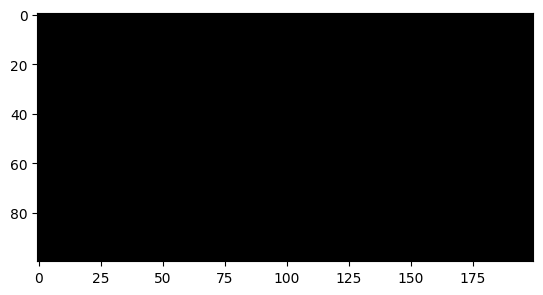

In [10]:
from PIL import Image
img = Image.new(mode='RGB', size=(200,100 ),  color=(0,0,0))
plt.imshow(img)

In [11]:
from PIL import ImageDraw

draw = ImageDraw.Draw(img)

Step 3: Preparing the Text Element and Adding Text to the Image

In [12]:
import matplotlib.pyplot as plt 
from matplotlib import image

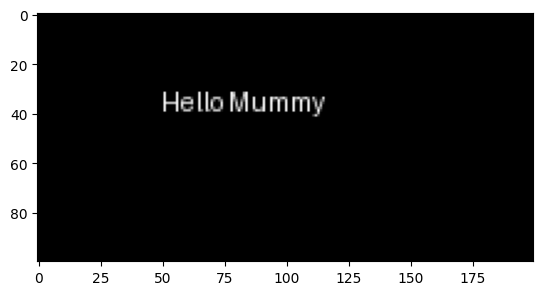

In [13]:
text = 'Hello Mummy'
draw.text((50,30), text)
plt.imshow(img)

Text Color

Checkout below mentioned resources for font type and color
Font - https://fonts.google.com/
Color - https://g.co/kgs/hMV71G

In [14]:
# Exploring Built-in color names in PIL
from PIL import ImageColor

colors=ImageColor.colormap
print(colors)

# Hexcode representation of colors

{'aliceblue': '#f0f8ff', 'antiquewhite': '#faebd7', 'aqua': '#00ffff', 'aquamarine': '#7fffd4', 'azure': '#f0ffff', 'beige': '#f5f5dc', 'bisque': '#ffe4c4', 'black': '#000000', 'blanchedalmond': '#ffebcd', 'blue': '#0000ff', 'blueviolet': '#8a2be2', 'brown': '#a52a2a', 'burlywood': '#deb887', 'cadetblue': '#5f9ea0', 'chartreuse': '#7fff00', 'chocolate': '#d2691e', 'coral': '#ff7f50', 'cornflowerblue': '#6495ed', 'cornsilk': '#fff8dc', 'crimson': '#dc143c', 'cyan': '#00ffff', 'darkblue': '#00008b', 'darkcyan': '#008b8b', 'darkgoldenrod': '#b8860b', 'darkgray': '#a9a9a9', 'darkgrey': '#a9a9a9', 'darkgreen': '#006400', 'darkkhaki': '#bdb76b', 'darkmagenta': '#8b008b', 'darkolivegreen': '#556b2f', 'darkorange': '#ff8c00', 'darkorchid': '#9932cc', 'darkred': '#8b0000', 'darksalmon': '#e9967a', 'darkseagreen': '#8fbc8f', 'darkslateblue': '#483d8b', 'darkslategray': '#2f4f4f', 'darkslategrey': '#2f4f4f', 'darkturquoise': '#00ced1', 'darkviolet': '#9400d3', 'deeppink': '#ff1493', 'deepskyblue'

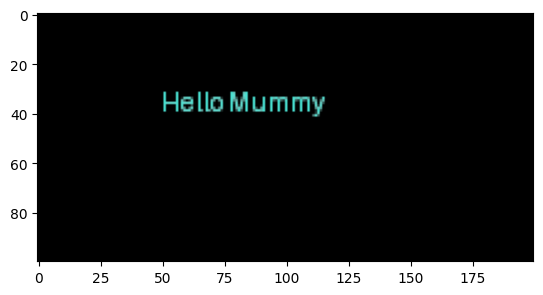

In [15]:
# Adding colored text to the image
draw.text((50,30), text, fill='turquoise')
plt.imshow(img)

In [ ]:
from PIL import Image
from PIL import ImageDraw
from PIL import ImageFont

img = Image.new(mode="RGB", size=(200, 100), color=(0, 0, 0))

draw = ImageDraw.Draw(img)

text="Hello World!"

# Font Type and Size
#font = ImageFont.truetype('Fonts/RubikDistressed-Regular.ttf', 15)

draw.text((50, 30), text, font=font, fill=(255, 140, 0))

plt.imshow(img)

In [ ]:
from PIL import Image, ImageDraw, ImageFont

img = Image.new(mode="RGB", size=(400, 300), color=(0, 0, 0))

draw = ImageDraw.Draw(img)

text_1 = 'Image Manipulation'
text_2 = 'Python'
text_3 = 'ThatAIGuy'

font_1 = ImageFont.truetype('Fonts/CrimsonText-Regular.ttf', 40)
font_2 = ImageFont.truetype('Fonts/Pacifico-Regular.ttf', 50)
font_3 = ImageFont.truetype('Fonts/Inconsolata-Bold.ttf', 30)

draw.text((50, 30), text_1, font=font_1, fill='hotpink')
draw.text((150, 80), text_2, font=font_2, fill=(255, 140, 0))
draw.text((200, 230), text_3, font=font_3, fill='aqua')

plt.imshow(img)

In [ ]:
from PIL import Image, ImageDraw, ImageFont

# Open the image
img = Image.open("images/4.jpeg")

# Call Draw method to add 2D graphics on the image
DRAW = ImageDraw.Draw(img)

# Customize font type and font style
CUST_FONT = ImageFont.truetype('Fonts/RubikDistressed-Regular.ttf', 300)

TEXT = """Black Panther
Wakanda Forever"""

# Add text to the image
DRAW.text((1500, 1000), text=TEXT, fill=(0, 0, 0), font=CUST_FONT)

# Display the image
plt.imshow(img)
# img.show()

# Save the image
img.save("images/transform.png")